In [1]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits import mplot3d

from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go

In [2]:
path= r'C:\Users\jphil\OneDrive\Documents\CareerFoundry Data Analytics\Specialization- Machine Learning'

In [6]:
climate=pd.read_csv(os.path.join(path, 'Data Sets', 'climate_scaled.csv'), index_col=False)

In [7]:
#Reduce to just the mean temperatures
df = climate[['DATE', 'MONTH','BASEL_temp_mean',
 'BELGRADE_temp_mean',
 'BUDAPEST_temp_mean',
 'DEBILT_temp_mean',
 'DUSSELDORF_temp_mean',
 'GDANSK_temp_mean',
 'HEATHROW_temp_mean',
 'KASSEL_temp_mean',
 'LJUBLJANA_temp_mean',
 'MAASTRICHT_temp_mean',
 'MADRID_temp_mean',
 'MUNCHENB_temp_mean',
 'OSLO_temp_mean',
 'ROMA_temp_mean',
 'SONNBLICK_temp_mean',
 'STOCKHOLM_temp_mean',
 'TOURS_temp_mean',
 'VALENTIA_temp_mean']].copy()

In [8]:
df

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,1,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,19600102,1,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,19600103,1,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,19600104,1,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,19600105,1,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,0.747959,0.628750,-0.005167,0.898267,1.042841,0.440753,0.906865,-0.005705,0.481853,1.268193,0.683127,0.664244,0.395898,-0.000746,0.826301,0.517090,1.295755,-0.007287
22946,20221028,10,0.856604,0.367720,-0.005167,0.945734,1.278467,0.466330,0.802037,-0.005705,0.263891,1.313202,0.561815,0.890456,0.541516,-0.000746,1.074927,0.641496,1.358505,-0.007287
22947,20221029,10,0.856604,0.083991,-0.005167,0.914089,1.101748,0.786039,0.924336,-0.005705,0.300218,1.208181,0.548336,1.053832,0.395898,-0.000746,1.221178,0.716139,1.405568,-0.007287
22948,20221030,10,0.680055,0.265577,-0.005167,0.692578,0.880848,0.376811,0.697210,-0.005705,0.397090,0.923123,0.103526,0.689378,-0.065226,-0.000746,1.235803,0.019467,0.668249,-0.007287


In [9]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notemp = df.drop(['DATE','MONTH'], axis=1)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18]),
 [Text(1, 0, 'BASEL_temp_mean'),
  Text(2, 0, 'BELGRADE_temp_mean'),
  Text(3, 0, 'BUDAPEST_temp_mean'),
  Text(4, 0, 'DEBILT_temp_mean'),
  Text(5, 0, 'DUSSELDORF_temp_mean'),
  Text(6, 0, 'GDANSK_temp_mean'),
  Text(7, 0, 'HEATHROW_temp_mean'),
  Text(8, 0, 'KASSEL_temp_mean'),
  Text(9, 0, 'LJUBLJANA_temp_mean'),
  Text(10, 0, 'MAASTRICHT_temp_mean'),
  Text(11, 0, 'MADRID_temp_mean'),
  Text(12, 0, 'MUNCHENB_temp_mean'),
  Text(13, 0, 'OSLO_temp_mean'),
  Text(14, 0, 'ROMA_temp_mean'),
  Text(15, 0, 'SONNBLICK_temp_mean'),
  Text(16, 0, 'STOCKHOLM_temp_mean'),
  Text(17, 0, 'TOURS_temp_mean'),
  Text(18, 0, 'VALENTIA_temp_mean')])

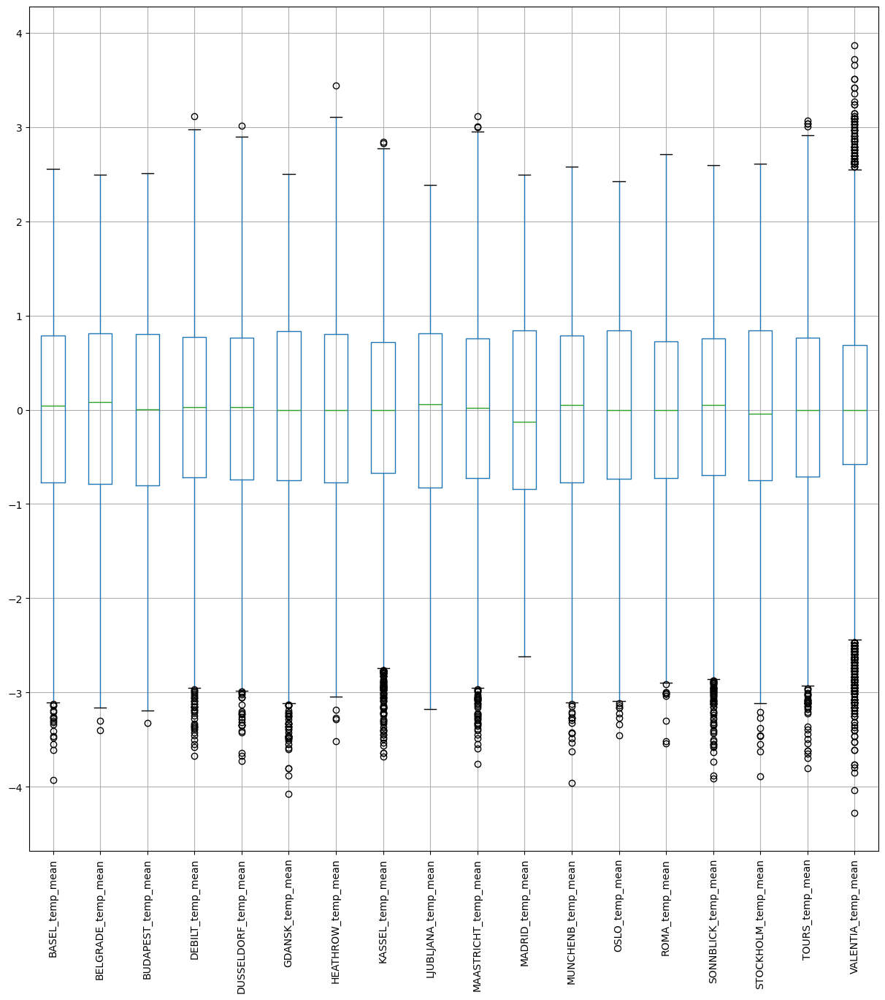

In [10]:
#Look at a whisker plot of the data to see variations in temperatures
notemp.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

# 01- Gradient Descent round one (year- 1980; station- Madrid)

In [11]:
#Reduce your dataset to a single year
dfyear = df[df['DATE'].astype(str).str.contains('1980')] #<-----INSERT YEAR HERE
dfyear

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
7305,19800101,1,-1.520011,-1.504889,-1.346195,-1.443423,-1.504866,-1.183368,-2.272906,-1.585724,-1.504023,-1.537377,-0.327805,-1.459643,-1.230172,-1.836111,-2.142594,-1.025542,-1.324080,-1.899944
7306,19800102,1,-1.642237,-1.629730,-1.357958,-1.649112,-1.519592,-1.157791,-2.272906,-1.511891,-1.600895,-1.552380,-0.880448,-1.585317,-1.533543,-1.970817,-2.508221,-1.423640,-1.606457,-1.299100
7307,19800103,1,-1.492850,-1.720523,-1.652043,-1.949735,-1.607952,-1.234521,-1.504171,-2.058253,-1.673549,-1.567383,-1.271341,-1.698423,-2.176691,-2.290743,-2.712972,-1.635130,-1.731958,-0.457920
7308,19800104,1,-1.533592,-2.106394,-1.957892,-1.332668,-1.313420,-1.439135,-1.049918,-1.570958,-2.048928,-1.207310,-1.271341,-1.773827,-2.625680,-2.711698,-2.010968,-1.697333,-1.010327,-0.908552
7309,19800105,1,-1.003946,-1.902110,-2.216686,-0.968756,-0.871621,-1.682114,-1.119803,-1.157495,-1.286061,-0.922252,-1.257862,-0.831274,-1.654892,-2.071846,-0.797085,-1.075304,-0.790700,-0.938594
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7666,19801227,12,-1.316301,-1.300605,-1.063873,-1.459245,-1.342873,-1.029908,-1.608998,-1.260860,-1.140753,-1.462362,-1.244383,-1.371671,-1.606353,-1.819273,-1.981718,-1.087745,-1.324080,-1.208974
7667,19801228,12,-1.601495,-1.300605,-0.958002,-1.427601,-1.210333,-1.042696,-1.364400,-1.630024,-1.358715,-1.492368,-1.513965,-1.962338,-0.465676,-1.701405,-1.879342,-0.801611,-1.763333,-1.058763
7668,19801229,12,-1.778043,-1.346001,-1.205034,-0.604845,-0.768534,-0.556739,-0.875205,-1.334693,-1.927838,-0.892246,-1.325258,-2.515302,-0.077361,-1.667729,-0.928711,-0.366191,-2.155524,-0.277667
7669,19801230,12,-1.750882,-1.436795,-1.146217,-0.367511,-0.606541,-0.121935,-0.386009,-0.980296,-1.988383,-0.682203,-1.001760,-1.861799,-0.380732,-1.802435,-0.182831,-0.403513,-1.982960,-0.157498


In [12]:
dfyear.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,1.980067e+07,6.513661,-0.197121,-0.214033,-0.196820,-0.122397,-0.106802,-0.214563,-0.146567,-0.165999,-0.201214,-0.168943,-0.099360,-0.217327,-0.138798,-0.197698,-0.172441,-0.159358,-0.117418,-0.111532
std,3.457653e+02,3.455958,0.924807,0.939291,0.948622,0.990698,0.974691,1.020085,0.943949,1.031533,0.945756,0.956203,0.993644,0.944074,1.128937,1.067570,0.999295,1.074994,0.977255,1.047305
min,1.980010e+07,1.000000,-2.484237,-2.492265,-2.769566,-2.693380,-2.432643,-2.487780,-2.272906,-2.634148,-2.678596,-2.497572,-2.039649,-2.515302,-3.086805,-2.711698,-3.063975,-2.904069,-2.516340,-2.771167
25%,1.980040e+07,4.000000,-0.902091,-1.005527,-0.978588,-0.865912,-0.812714,-1.119426,-0.888308,-0.935997,-0.989390,-0.854738,-0.890557,-0.950664,-1.023880,-1.027877,-0.899461,-1.022432,-0.916201,-0.878510
50%,1.980070e+07,7.000000,-0.229849,-0.160016,-0.128682,-0.090622,-0.105836,-0.179482,-0.185090,-0.190287,-0.202305,-0.194604,-0.280628,-0.202905,-0.077361,-0.354349,-0.109705,-0.154701,-0.069069,-0.112435
75%,1.980098e+07,9.750000,0.517087,0.537957,0.568299,0.692578,0.630495,0.722097,0.627324,0.655097,0.581753,0.563050,0.764001,0.522861,0.808483,0.807488,0.533799,0.753461,0.652562,0.713725
max,1.980123e+07,12.000000,1.929476,1.672872,1.818161,1.990001,2.088432,1.796319,1.885256,2.135442,1.729081,1.973336,2.084952,2.159761,1.985564,2.120868,2.025558,1.873113,2.001698,2.155749


In [13]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear = dfyear.drop(['DATE','MONTH'], axis=1)

In [14]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notempyear.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [15]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [16]:
n_rows = dfyear.shape[0]
n_rows

366

In [17]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear['MADRID_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [18]:
X.shape, y.shape

((366, 2), (366, 1))

In [19]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear['MADRID_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [20]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear['MADRID_temp_mean'].min()

-2.0396494276725847

In [21]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
dfyear['MADRID_temp_mean'].max()

2.0849520909700314

In [22]:
#This computes the loss function for the gradient descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [23]:
compute_cost(X,y)

array([0.49725181])

In [24]:
#This is the gradient descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [70]:
%%time
#This runs your data through a gradient descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=1500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.001 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 1.17 s
Wall time: 1.23 s


In [71]:
theta

array([[ 0.22875608],
       [-0.10049787]])

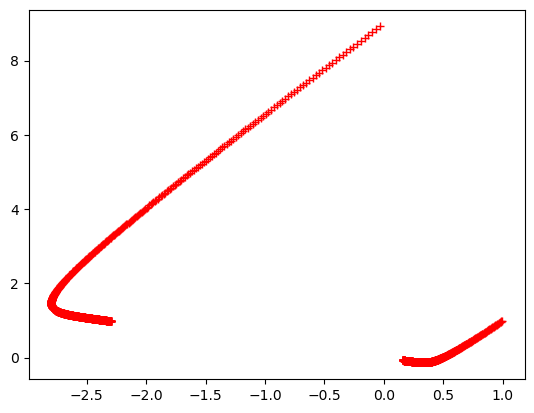

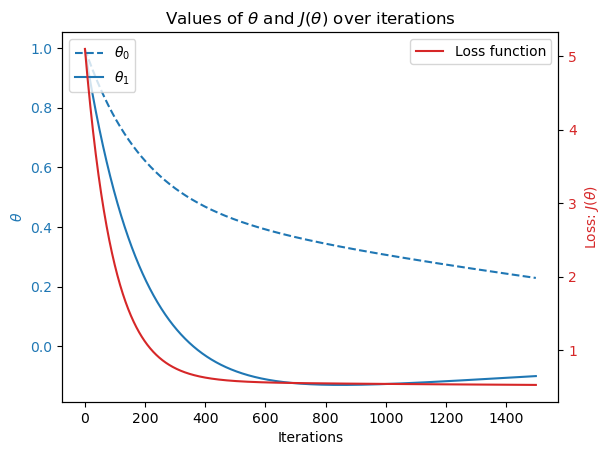

In [72]:
fig, ax1 = plt.subplots()

# Plot theta0 and theta1 over time
color = 'tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
ax1.set_xlabel('Iterations')
ax1.set_ylabel('$\\theta$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Add legend for thetas
ax1.legend(loc='upper left')

# Plot loss function over time on the secondary y-axis
ax2 = ax1.twinx()
color = 'tab:red'
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.tick_params(axis='y', labelcolor=color)

# Add legend for the loss function
ax2.legend(loc='upper right')

# Ensure the plot renders
plt.show()


In [73]:
%%time
# theta range
theta0_vals = np.linspace(1,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(1,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 2.72 s
Wall time: 2.75 s


In [74]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [75]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [76]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=1500 #<---start with the same iterations as above
theta_init=np.array([[0],[9]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.001 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

In [77]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

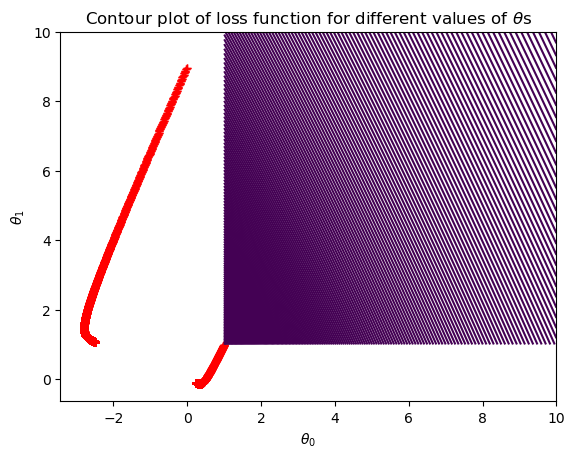

In [78]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');
plt.show()

# 02- Second Round with a new year (1960) and station (Budapest)

In [79]:
#Reduce your dataset to a single year
dfyear1 = df[df['DATE'].astype(str).str.contains('1960')] #<-----INSERT YEAR HERE
dfyear1

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,1,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,19600102,1,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,19600103,1,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,19600104,1,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,19600105,1,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,19601227,12,-1.289140,-1.277907,-1.440302,-1.126979,-0.974707,-0.940389,-1.469228,-0.891697,-1.721985,-0.997267,-1.069155,-1.120324,-0.417137,-1.785596,-0.914086,-0.403513,-1.104453,-1.629564
362,19601228,12,-1.289140,-1.255208,-1.416775,-1.522534,-1.283966,-0.978754,-1.469228,-1.054129,-1.479805,-1.342338,-1.338737,-1.321402,-0.550620,-1.381479,-1.279713,-0.565240,-1.653520,-1.509396
363,19601229,12,-1.207656,-1.221161,-1.122690,-1.570001,-1.313420,-1.234521,-1.434286,-1.305160,-1.443478,-1.342338,-0.920885,-1.459643,-0.708373,-1.819273,-1.659965,-0.615003,-1.073078,-0.998679
364,19601230,12,-1.547172,-1.243859,-1.169744,-1.316845,-1.372326,-0.889236,-1.084860,-1.393759,-1.273952,-1.177304,-0.772615,-1.547614,-0.829722,-1.549861,-1.674591,-0.726968,-0.900514,-1.239016


In [80]:
dfyear1.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.660000e+02,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,1.960067e+07,6.513661,-0.102317,-0.032384,-0.063919,-0.052666,-0.034416,-0.067706,-0.103366,0.026208,-0.074499,-0.063840,-0.130480,-0.101680,-0.078422,0.092554,-0.175958,-0.092804,-0.059940,-0.057276
std,3.457653e+02,3.455958,0.935826,0.920271,0.946637,0.910451,0.919531,0.978767,0.919195,0.964448,0.906193,0.902235,0.979590,0.938523,0.998018,1.002362,0.884235,0.988702,0.944029,1.127911
min,1.960010e+07,1.000000,-3.190431,-2.401472,-2.416664,-2.645913,-2.874442,-2.922584,-2.307849,-3.446307,-2.714923,-3.247725,-2.322710,-3.017997,-2.249500,-2.408610,-3.502727,-2.356684,-3.112470,-2.951420
25%,1.960040e+07,4.000000,-0.756099,-0.594120,-0.675681,-0.668134,-0.661766,-0.825294,-0.840262,-0.666507,-0.738129,-0.712209,-0.890557,-0.777863,-0.738711,-0.653227,-0.764178,-0.798501,-0.692653,-0.848468
50%,1.960070e+07,7.000000,-0.053300,0.055618,-0.005167,-0.011511,-0.002750,-0.096358,-0.071526,0.082894,-0.002507,0.052946,-0.294107,-0.001827,-0.168373,-0.009165,-0.124331,-0.179582,0.032900,-0.037330
75%,1.960098e+07,9.750000,0.649499,0.662798,0.744750,0.692578,0.715174,0.757265,0.714681,0.802762,0.699815,0.649317,0.787590,0.626541,0.869157,1.110576,0.475298,0.877867,0.683937,0.893978
max,1.960123e+07,12.000000,1.820830,1.843109,1.806397,1.847601,1.970619,1.834684,1.745486,2.002543,1.668536,1.688278,1.936682,1.858144,1.985564,1.952486,1.967058,1.686504,1.938947,2.606381


In [81]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear1 = dfyear1.drop(['DATE','MONTH'], axis=1)

In [82]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notempyear1.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [87]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [88]:
n_rows1 = dfyear1.shape[0]
n_rows1

366

In [89]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows1,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows1,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear1['BUDAPEST_temp_mean'].to_numpy().reshape(n_rows1,1) #<----INSERT WEATHER STATION HERE

In [90]:
X.shape, y.shape

((366, 2), (366, 1))

In [91]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear1['BUDAPEST_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [92]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear1['BUDAPEST_temp_mean'].min()

-2.4166643260714715

In [93]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
dfyear1['BUDAPEST_temp_mean'].max()

1.8063974207400055

In [94]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [95]:
compute_cost(X,y)

array([0.44887979])

In [96]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [111]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=1000 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.001 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 672 ms
Wall time: 684 ms


In [112]:
theta

array([[ 0.29340553],
       [-0.08865478]])

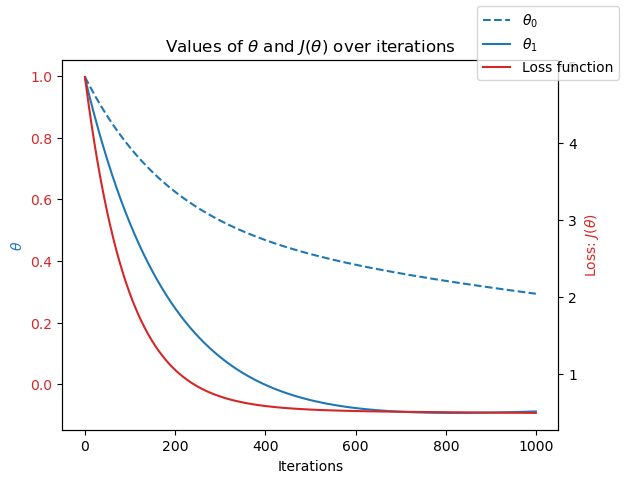

In [113]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
plt.show()

In [114]:
%%time
# theta range
theta0_vals = np.linspace(1,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(1,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 2.88 s
Wall time: 2.88 s


In [115]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [116]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [117]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=1000 #<---start with the same iterations as above
theta_init=np.array([[-3],[5]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.001 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

In [118]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

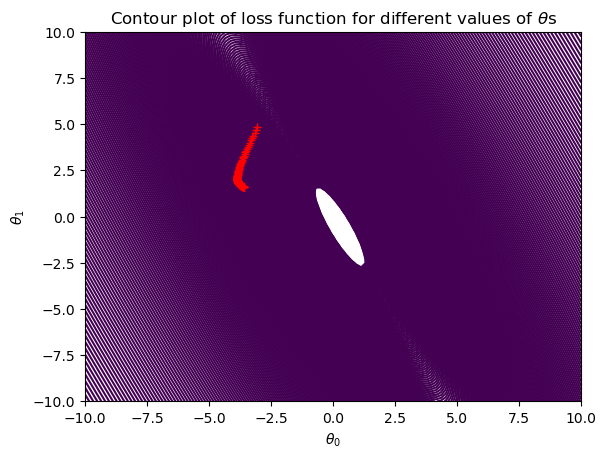

In [110]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');
plt.show()

# 03- GD round 3: Year 2020, Stockholm weather station

In [129]:
#Reduce your dataset to a single year
dfyear2 = df[df['DATE'].astype(str).str.contains('2019')] #<-----INSERT YEAR HERE
dfyear2

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
21550,20190101,1,-0.732333,-1.232510,-1.052110,-0.367511,-0.562362,-0.352125,-0.595665,-0.005705,-1.031772,-0.592185,-1.123071,-0.617629,-0.210845,-0.000746,-0.533833,-0.391072,-0.712262,-0.007287
21551,20190102,1,-0.963204,-1.107669,-0.993293,-0.731423,-0.989434,-0.786929,-1.084860,-0.005705,-1.043881,-1.042277,-1.203946,-1.082622,-0.659834,-0.000746,-1.382089,-1.037982,-0.916201,-0.007287
21552,20190103,1,-1.452108,-1.527588,-1.475592,-0.952934,-1.048340,-0.953178,-1.102331,-0.005705,-1.104426,-1.042277,-1.028718,-1.371671,-0.659834,-0.000746,-2.508221,-1.212150,-1.324080,-0.007287
21553,20190104,1,-1.424946,-1.856713,-1.534409,-0.778890,-1.151427,-0.978754,-1.434286,-0.005705,-1.395042,-1.147298,-1.217425,-1.271132,-0.502081,-0.000746,-2.230344,-0.577681,-1.449581,-0.007287
21554,20190105,1,-1.126172,-1.731872,-1.216797,-0.478267,-0.709628,-0.607892,-1.259573,-0.005705,-1.479805,-0.757219,-1.284820,-1.132891,-0.380732,-0.000746,-1.528340,-0.838933,-1.433893,-0.007287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21910,20191227,12,-0.487881,-1.084971,-0.863895,-1.063690,-0.945254,-0.595104,-0.648078,-0.005705,-0.934900,-0.697206,-0.813052,-0.667898,-1.375790,-0.000746,-0.884835,-1.013101,-0.084757,-0.007287
21911,20191228,12,-0.908881,-1.209812,-1.110927,-1.601646,-1.490139,-0.722987,-0.543251,-0.005705,-1.213407,-1.237316,-0.907406,-1.145458,-0.926801,-0.000746,-1.294338,-1.174829,-0.461260,-0.007287
21912,20191229,12,-1.520011,-1.368700,-1.287378,-1.395957,-1.225060,-0.799717,-0.438423,-0.005705,-1.467696,-1.357341,-0.961322,-1.333969,-0.247249,-0.000746,-1.440589,-0.565240,-1.277017,-0.007287
21913,20191230,12,-1.343462,-1.607032,-1.299141,-0.858001,-0.901074,-0.556739,-0.822791,-0.005705,-1.576677,-0.772222,-1.069155,-1.132891,-0.113766,-0.000746,-0.738584,0.094110,-1.449581,-0.007287


In [130]:
dfyear2.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.650000e+02,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,3.650000e+02
mean,2.019067e+07,6.526027,0.170502,0.282088,0.269420,0.184273,0.169048,0.244828,0.172018,-5.705221e-03,0.224877,0.194509,0.163277,0.250347,0.105426,-7.461638e-04,0.190690,0.156688,0.244511,-7.287352e-03
std,3.454755e+02,3.452584,0.976797,0.942994,0.963701,0.942226,0.986419,0.910151,0.975865,4.777038e-17,0.960609,0.968814,1.025720,0.938443,0.914662,4.559900e-18,1.031892,0.920464,0.997437,4.603327e-17
min,2.019010e+07,1.000000,-1.669398,-1.924808,-1.699097,-1.997201,-2.093931,-2.027399,-2.028309,-5.705221e-03,-1.782530,-2.047481,-1.743109,-1.685856,-2.067477,-7.461638e-04,-2.508221,-1.747095,-1.731958,-7.287352e-03
25%,2.019040e+07,4.000000,-0.555784,-0.404022,-0.463939,-0.525734,-0.577088,-0.480009,-0.595665,-5.705221e-03,-0.474758,-0.562179,-0.718699,-0.479388,-0.587025,-7.461638e-04,-0.533833,-0.540359,-0.476948,-7.287352e-03
50%,2.019070e+07,7.000000,0.096087,0.333672,0.206575,0.091333,0.026704,0.121044,0.068244,-5.705221e-03,0.154910,0.127961,-0.044744,0.199251,0.007583,-7.461638e-04,0.080421,0.031908,0.087807,-7.287352e-03
75%,2.019100e+07,10.000000,0.897346,1.003272,1.053540,0.914089,0.895575,1.016229,0.976750,-5.705221e-03,1.075195,0.908120,0.912271,0.953293,0.941966,-7.461638e-04,1.104177,0.927629,0.934939,-7.287352e-03
max,2.019123e+07,12.000000,2.540605,2.070092,2.100483,2.970979,3.016209,2.282276,3.073302,-5.705221e-03,2.225550,3.113568,2.354534,2.360839,2.288935,-7.461638e-04,2.464311,2.271212,3.037082,-7.287352e-03


In [131]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear2 = dfyear2.drop(['DATE','MONTH'], axis=1)

In [132]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notempyear2.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [133]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [134]:
n_rows2 = dfyear2.shape[0]
n_rows2

365

In [135]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows2,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows2,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear2['STOCKHOLM_temp_mean'].to_numpy().reshape(n_rows2,1) #<----INSERT WEATHER STATION HERE

In [136]:
X.shape, y.shape

((365, 2), (365, 1))

In [137]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear2['STOCKHOLM_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [139]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear2['STOCKHOLM_temp_mean'].min()

-1.7470952320682225

In [140]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
dfyear2['STOCKHOLM_temp_mean'].max()

2.271211659250307

In [141]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [142]:
compute_cost(X,y)

array([0.43474191])

In [143]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [155]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=1000 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.001 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 812 ms
Wall time: 824 ms


In [156]:
theta

array([[ 0.37758707],
       [-0.04176083]])

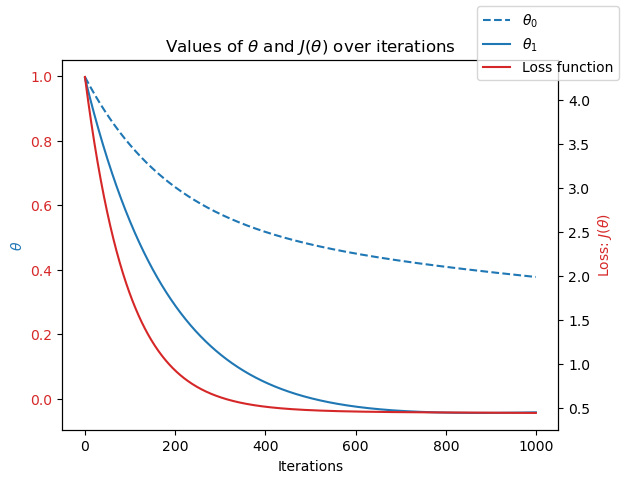

In [157]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();
plt.show()

In [158]:
%%time
# theta range
theta0_vals = np.linspace(1,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(1,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 2.41 s
Wall time: 2.43 s


In [159]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [160]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [161]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=1000 #<---start with the same iterations as above
theta_init=np.array([[0],[0.4]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.001 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

In [162]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

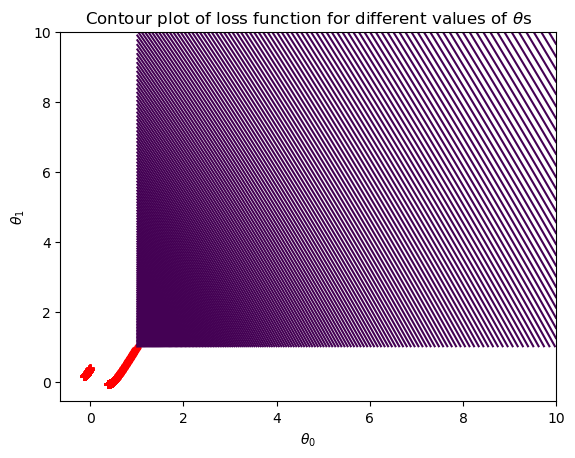

In [163]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');
plt.show()